# HealthCare Analytics: Predicting the Length of Stay (LOS) of a patient 

Healthcare is one of the extremely important services of a nation to keep their population healthy and working for the economy to boom. Lack of healthcare or the collapse of healthcare can lead to massive implications for a country's development. This is the reason as to why every goverment of every country spends billions of dollars to improve and keep their healthcare functioning so as to give the general population affordable healthcare options.

However, challenges faced by a country such as India are far more complicated than the rest of the world. A country with 1.33 billion people with sizeable population living in the remote areas make it a very tough task for everyone to be provided with equal and afforable healthcare oppoptunities. Many poor people need to travel thousands of KMs to get the required healthcare. Another issue faced by healthcares due to the increasing population is the lack of beds and healthcare personnel. This has been especially observed during the tough times of COVID-19 where people with even mild symptoms would flock in big numbers at the goverment healthcare facilities making it extremely tough for the officials to manage the patients.

Innovative methods must be sought after so that the officials can be able to forecast the traffic of patients. Judging the health problems, we can come up with a ML algorithm that can predict how long would a patient require hospitalisation. If the algorithm can help the officials get a ballpark value of hospitalisation period, they'll be able to handle the traffic of patients much better.


- Objective: Predict the Length of Stay for each patient on case by case basis so that the Hospitals can use this information for optimal resource allocation and better functioning
- The length of stay is divided into 11 different classes ranging from 0-10 days to more than 100 days.

## Load Libraries & Data

In [68]:
import numpy as np
import pandas as pd
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import plotly
sns.set_style("whitegrid")
plt.style.use("fivethirtyeight")
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
plotly.offline.init_notebook_mode (connected = True)

In [2]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [55]:
train = pd.read_csv('Project_Sets/train_data.csv')
train['Count']=1
test = pd.read_csv('Project_Sets/test_data.csv')
dictionary = pd.read_csv('Project_Sets/train_data_dictionary.csv')
sample = pd.read_csv('Project_Sets/sample_sub.csv')

## Data Dictionary

In [56]:
dictionary

,Column,Description
0,case_id,Case_ID registered in Hospital
1,Hospital_code,Unique code for the Hospital
2,Hospital_type_code,Unique code for the type of Hospital
3,City_Code_Hospital,City Code of the Hospital
4,Hospital_region_code,Region Code of the Hospital
5,Available Extra Rooms in Hospital,Number of Extra rooms available in the Hospital
6,Department,Department overlooking the case
7,Ward_Type,Code for the Ward type
8,Ward_Facility_Code,Code for the Ward Facility
9,Bed Grade,Condition of Bed in the Ward


#### Hypothesis: 
The following features may have relevance with the Length of Stay of a patient
- Department: Relates to the type of disease
- Type of Admission: Relates to patients' reason of admission to the hospital
- Severity of Illness: Relates to the curability of disease
- Age: Relates to the curability of disease

# 1. Exploratory Data Analysis
* What question(s) are you trying to solve?
* What kind of data do we have and how do we treat different types?
* What's missing from the data and how do you deal with it?
* Where are the outliers and why should you care about them?
* How can you add, change or remove features to get more out of your data?

In [57]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 318438 entries, 0 to 318437
Data columns (total 19 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   case_id                            318438 non-null  int64  
 1   Hospital_code                      318438 non-null  int64  
 2   Hospital_type_code                 318438 non-null  object 
 3   City_Code_Hospital                 318438 non-null  int64  
 4   Hospital_region_code               318438 non-null  object 
 5   Available Extra Rooms in Hospital  318438 non-null  int64  
 6   Department                         318438 non-null  object 
 7   Ward_Type                          318438 non-null  object 
 8   Ward_Facility_Code                 318438 non-null  object 
 9   Bed Grade                          318325 non-null  float64
 10  patientid                          318438 non-null  int64  
 11  City_Code_Patient                  3139

In [6]:
train.head(5)

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay
0,1,8,c,3,Z,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,Extreme,2,51-60,4911.0,0-10
1,2,2,c,5,Z,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,5954.0,41-50
2,3,10,e,1,X,2,anesthesia,S,E,2.0,31397,7.0,Trauma,Extreme,2,51-60,4745.0,31-40
3,4,26,b,2,Y,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,7272.0,41-50
4,5,26,b,2,Y,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,5558.0,41-50


As we can see, we have numerous columns showing information such as hospital code, hospital type code and many other such identifiers. While a detailed documentation is not available as to what these codes mean, we will preserve them as they could provide great insight for our machine learning.

In [7]:
train.Stay.value_counts()

21-30                 87491
11-20                 78139
31-40                 55159
51-60                 35018
0-10                  23604
41-50                 11743
71-80                 10254
More than 100 Days     6683
81-90                  4838
91-100                 2765
61-70                  2744
Name: Stay, dtype: int64

In [51]:
# Check for unique values in every column
for features in train.columns:
    print('Unique Values for {}'.format(features))
    print(train[features].unique())
    print('======================================')
    print()

Unique Values for case_id
[     1      2      3 ... 318436 318437 318438]

Unique Values for Hospital_code
[ 8  2 10 26 23 32  1 22 16  9  6 29 12  3 21 28 27 19  5 14 13 31 24 17
 25 15 11 30 18  4  7 20]

Unique Values for Hospital_type_code
[2 4 1 0 5 3 6]

Unique Values for City_Code_Hospital
[ 3  5  1  2  6  9 10  4 11  7 13]

Unique Values for Available Extra Rooms in Hospital
[-0.16917678 -1.02521686 -1.88125695  0.68686331  2.39894348  1.5429034
  3.25498357  4.11102365  4.96706374  5.82310383  7.535184   -2.73729704
  6.67914391 14.38350469  9.24726417 15.23954478  8.39122409 17.80766504]

Unique Values for Department
[3 1 2 0 4]

Unique Values for Ward_Type
[2 3 1 0 4 5]

Unique Values for Ward_Facility_Code
[5 4 3 1 0 2]

Unique Values for Type of Admission
[-1.13616487  0.31530634  1.76677755]

Unique Values for Severity of Illness
[0 2 1]

Unique Values for Visitors with Patient
[-0.72792324  0.40582594 -0.16104865  2.67332428  1.53957511  2.10644969
  5.50769721  0.972700

**Insights**:
1. Categorical features which need to be encoded:
- `Hospital_region_code`
- `Department`
- `Ward_Type`
- `Admission`
- `Illness`

2. Bins (range) which need to be encoded:
- `Age`
- `Stay` (Target)


In [53]:
# Look for null values
train.isna().sum()

case_id                              0
Hospital_code                        0
Hospital_type_code                   0
City_Code_Hospital                   0
Available Extra Rooms in Hospital    0
Department                           0
Ward_Type                            0
Ward_Facility_Code                   0
Type of Admission                    0
Severity of Illness                  0
Visitors with Patient                0
Age                                  0
Admission_Deposit                    0
Stay                                 0
dtype: int64

As we can see, most of columns don't have any missing values associated to them. This is a very good sign that we are dealing with pre-processed data.

`Bed Grade` and `City_Code_Patient` features have null values to be filled.
- But do we need them?

## Visualization

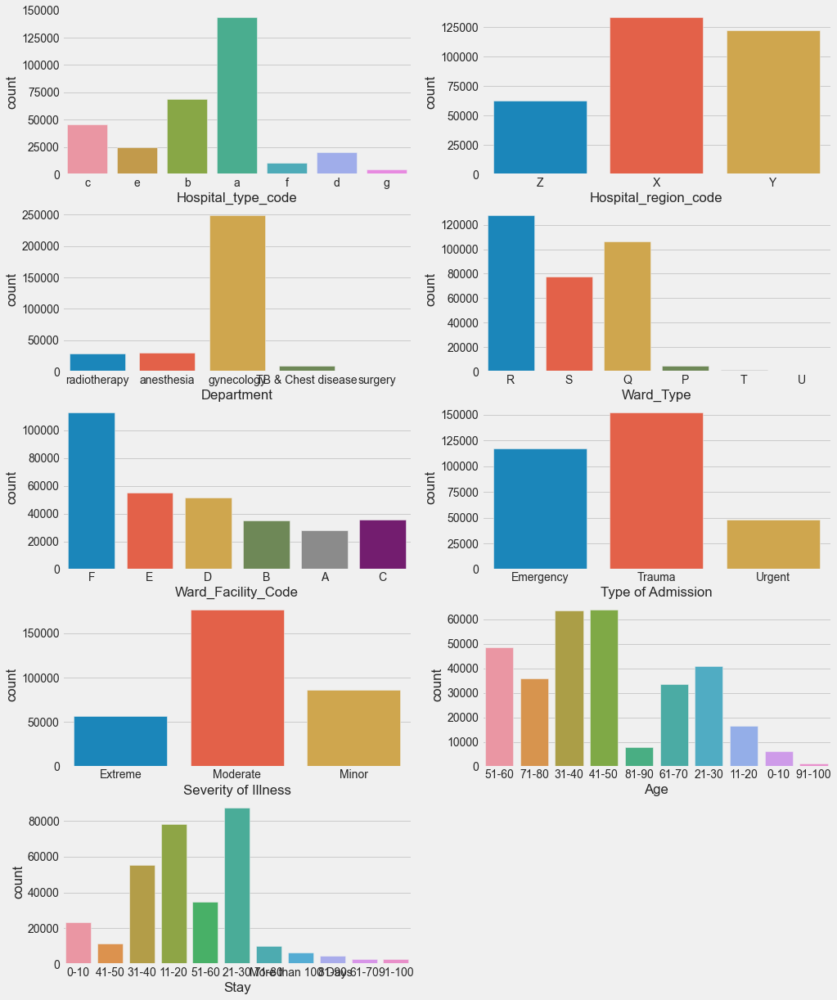

In [81]:
cat_cols= ['Hospital_type_code', 'Hospital_region_code', 'Department', 'Ward_Type', 'Ward_Facility_Code', 'Type of Admission', 'Severity of Illness', 'Age', 'Stay']

i=1
plt.figure(figsize=(15,20))
for col in cat_cols:
    plt.subplot(5,2,i)
    sns.countplot(train[col])
    i=i+1
plt.show()

<AxesSubplot:>

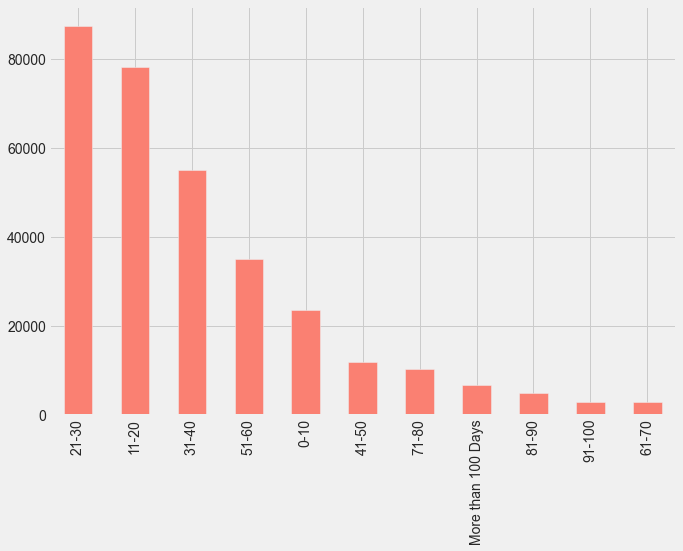

In [9]:
# Distribution of target feature
plt.figure(figsize=(10,7))
train.Stay.value_counts().plot(kind="bar", color = ['Salmon'])

Insight: Most of the patients stay in hospital for **21-30 days**, followed by **11-20**, **31-40**

### Hospital type code

Which hospitals have the highest patient density?

In [62]:
train_hos_code=train.groupby('Hospital_type_code')['Count'].sum().\
reset_index().sort_values(by='Count',ascending=False)

In [64]:
fig1=px.bar(train_hos_code,x='Hospital_type_code',y='Count',color='Count',labels={'Hospital_type_code':'Hospital Type Code','Count':'Number of patients'})
fig1.update_layout(title='Patient distribution per hospital type code',title_x=0.5)
fig1.show()

As we can see, the hospital type **A** has a much higher patient case load when in comparison any of the other hospital codes. Hospital type **G** has the least case load. Hence, hospital type A has a much higher likelihood of running out of patient beds while G has the least. The ideal distribution would've been a uniform distribution where the under utilised beds of other hospital type codes may have been equally utilised.

### Hospital Region

The region code would likely divide all the available hospitals into three regions encoded as X,Y and Z. This will again let us know which hospital type belongs to which region and their corresponding case loads as well.

In [65]:
fig2=px.sunburst(train,path=['Hospital_region_code','Hospital_type_code'])
fig2.update_layout(title='Hospital region case load distribution',title_x=0.5)
fig2.show()

As we can see from the above sunburst plot, the case loads in hospital region **X** is marginally higher than hospital region **Y** and the least in region **Z** .  For region X, the hospital type A had highest case load while it was more equally balanced between a and b in region Y. For region Z, highest case loads were in hospital type C. Hospitals in region X seem to show better distribution amogst all the hospital types.

For region Y, distribution between A and B is ideal but f,d and g have been under utilised. For Z, cases in hospital c were easily the highest but a and d are extremely under utilised.

### Available Extra Rooms in Hospital

This is an important indicator as to how the hospital is coping with the case loads. Lets check how the extra rooms are distributed across the various hospitals.

In [67]:
fig3=px.histogram(train,x='Available Extra Rooms in Hospital', marginal='box', \
                  color_discrete_sequence=['orange'],opacity=0.7)
fig3.update_layout(title='Number of hospitals with extra rooms',title_x=0.5)
fig3.show()

As we can see from the above histogram, majority of hospitals have extra rooms in the size of 2,3 or 4 rooms. The median extra rooms is 3.

### Available rooms Vs Region code

Lets check which region of X,Y and Z have most number of extra rooms available to them. Ideally, they should have a uniform distribution showing equal case loads.

In [70]:
df_beds=train[['Hospital_code','Available Extra Rooms in Hospital','Hospital_region_code']]
df_beds['Hospital_region_code']=df_beds['Hospital_region_code'].map({'X':1,'Y':2,'Z':3})
df_beds_grouped=df_beds.groupby('Hospital_code')[['Available Extra Rooms in Hospital','Hospital_region_code']].median().reset_index()

df_beds_grouped['Hospital_region_code']=df_beds_grouped['Hospital_region_code'].map({1:'X',2:'Y',3:'Z'})
df_beds_grouped.head()

,Hospital_code,Available Extra Rooms in Hospital,Hospital_region_code
0,1,3,Y
1,2,2,Z
2,3,3,Z
3,4,3,X
4,5,3,X


In [71]:
df_beds_1=df_beds_grouped.groupby('Hospital_region_code')['Available Extra Rooms in Hospital'].sum().reset_index()
fig4=px.pie(df_beds_1,values='Available Extra Rooms in Hospital',names='Hospital_region_code',hole=0.4)
fig4.update_layout(title='Number of extra rooms in each region code',title_x=0.5)
fig4.update_traces(textinfo='percent+label')

From the above pie chart, we see that the number of extra available rooms are almost equally distributed amongst the three region codes. This is an ideal scenario.

### Department

Here, we shall check which departments have the highest number of case loads

In [75]:
df_dept=train.groupby('Department')['Count'].sum().reset_index().sort_values(by='Count',ascending=False)

fig5=px.bar(df_dept,x='Department',y='Count',color='Department',labels={'Count':'Number of patients'})
fig5.update_layout(title='Case load distribution per department',title_x=0.5)
fig5.show()

From the above bar plot, we see that majority of the patients register themselves at the gynecology department. Surgery department has the least number of case loads. This is expected as daily birth cases are far higher than daily surgeries.

### Severity of illness

Let us check the number of patients of each severity of illness.

In [77]:
df_sev=train.groupby('Severity of Illness')['Count'].sum().reset_index().sort_values(by='Count',ascending=False)
fig6=px.funnel(df_sev,x='Count',y='Severity of Illness',labels={'Count':'Number of patients'},color='Count')
fig6.update_layout(title='Case load depending upon severity of illness',title_x=0.5)
fig6.show()

From the above funnel plot, we see that most numner of cases are moderate in nature followed by minor and then, extreme.

### Age Vs Severity of illness

Lets check if there's any relation amongst age and severity of illness

In [78]:
fig7=px.sunburst(train,path=['Age','Severity of Illness'])
fig7.update_layout(title='Age (in years) and Severity of Illness',title_x=0.5)
fig7.show()

As we can see from the sunburst plot above, extreme cases are least for each age group. However, the extreme cases in relation to the moderate and minor cases seem to increase with higher age groups.

### Severity of illness Vs Stay

Let us check how the severity of illness and stay period changes.

In [79]:
fig8=px.sunburst(train,path=['Stay','Severity of Illness'])
fig8.update_layout(title='Stay period (in days) vs Severity of illness',title_x=0.5)
fig8.show()

From the above plot, it is seen that generally for lower stay duration(upto 20 days), the severity of illness is majorly minor or moderate. For higher stay duration, the extreme severity cases start rising.

21-30 days and 11-20 days are the most common stay periods across the hospitals.